In [290]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.model_selection as ms
from sklearn import metrics
from sklearn.pipeline import Pipeline, make_pipeline
import sklearn.preprocessing as pp
import sklearn.feature_selection as fs
import sklearn.cluster as ct
from kneed import KneeLocator
sns.set()
%matplotlib inline
import importlib
import helpers
importlib.reload(helpers)
import time
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## MADELON

In [291]:
X_train = pd.read_hdf('data/madelon/madelon.hdf', 'X_train')
y_train = pd.read_hdf('data/madelon/madelon.hdf', 'y_train')

In [292]:
def get_kmeans_scores(X, ks=None, random_state=None):
    results = {
        "k": ks if ks is not None else np.arange(1, 11),
        "score": []
    }
    for k in results["k"]:
        kmeans = ct.KMeans(n_clusters=k, random_state=random_state)
        kmeans.fit(X)
        score = kmeans.score(X)
        results['score'].append(-score)
    return results

In [293]:
def plot_elbow_curve(centroids, errors, xlabel='Centroids', ylabel='SSE', title='Elbow Method showing optimal K', other_ks=None):
    kn = KneeLocator(centroids, errors, S=1.0, curve='convex', direction='decreasing')
    print("Knee", kn.knee)
    plt.plot(centroids, errors, 'bx-')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
    if other_ks is not None:
        for k in other_ks:
            plt.vlines(k, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', linewidths=0.7)
    plt.show()

In [294]:
start = time.time()
results = get_kmeans_scores(X_train, ks=np.arange(1, 25))
stop = time.time()
print("Took", stop-start, "s")

Took 29.390288829803467 s


In [295]:
resultsDf = pd.DataFrame(data=results)

In [296]:
kn = KneeLocator(results['k'], results['score'], S=1.0, curve='convex', direction='decreasing')
kn.knee

6

Knee 6


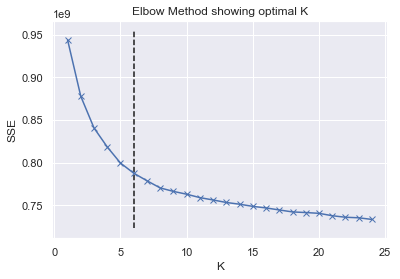

In [297]:
plot_elbow_curve(results['k'], results['score'], xlabel='K')

In [83]:
def find_cluster_features(centers, thresh='max'):
    k = centers.shape[0]
#     features = set()
    features = []
    for c1 in range(k):
        for c2 in range(c1 + 1, k):
            absdiff = np.abs(centers[c1] - centers[c2])
            if thresh == 'max':
                max_feature = np.argmax(absdiff)
                features.append(max_feature)
            else:
                found_features = np.where(absdiff > thresh)[0]
                for feat in found_features:
                    features.append(feat)
#             features.add(max_feature)
    return list(features)

In [298]:
def plot_cluster_features(X, y, centers, features, feature_names=None):
    k = centers.shape[0]
    for i in range(len(features)):
        for j in range (i + 1, len(features)):
            f1, f2 = features[i], features[j]
            plt.scatter(X[:, f1], X[:, f2], c=y, s=30, cmap='viridis')
            plt.scatter(centers[:, f1], centers[:, f2], c=np.arange(k), s=300, alpha=0.7, marker='o',
                        cmap='viridis', edgecolors='black', linewidths=2)
            xlabel = feature_names[f1] if feature_names is not None else 'feature %d' % f1
            ylabel = feature_names[f2] if feature_names is not None else 'feature %d' % f2
            plt.xlabel(xlabel)
            plt.ylabel(ylabel)
            plt.show()


In [299]:
def kmeans_experiment(X, y, k, random_state=None, thresh=150, feature_names=None):
    kmeans = ct.KMeans(n_clusters=k, random_state=random_state)
    kmeans.fit(X)
    clusters = kmeans.predict(X)
    centers = kmeans.cluster_centers_
    features = find_cluster_features(centers, thresh=thresh)
    print("Features", features)
    print("Unique features", sorted(list(set(features))))
    data = helpers.get_full_cluster_data(X, y, clusters, centers)
    helpers.plot_clusters_labels_all_features(data, list(set(features)), feature_names=feature_names)

### Experiment with 4 clusters

Features [453, 493, 64, 105, 336, 153, 493, 105, 453, 493, 105, 336, 338]
Unique features [64, 105, 153, 336, 338, 453, 493]


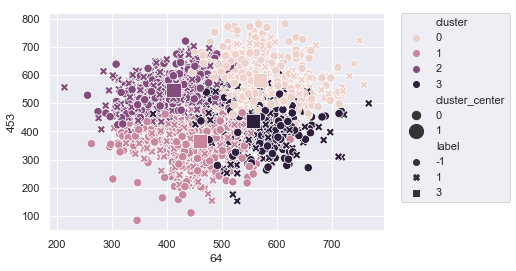

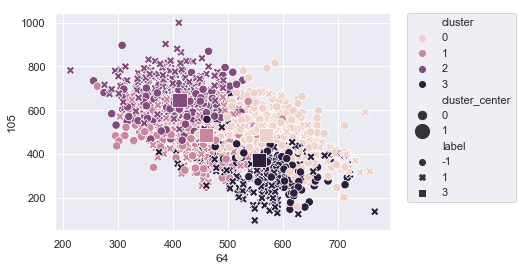

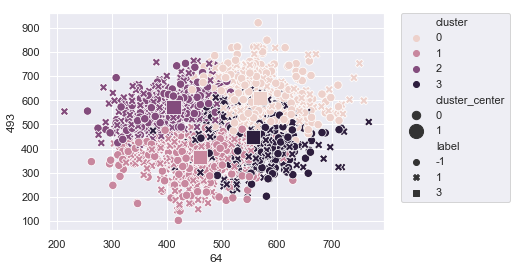

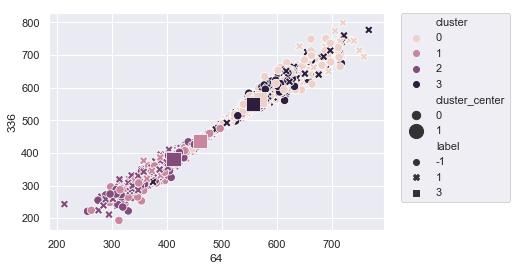

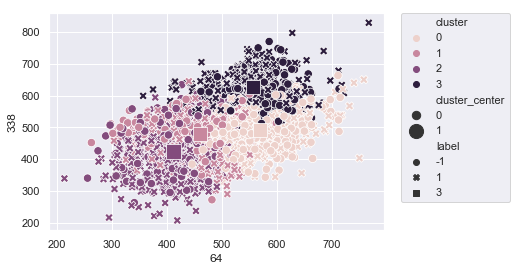

...

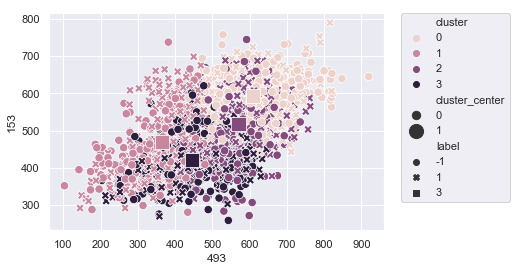

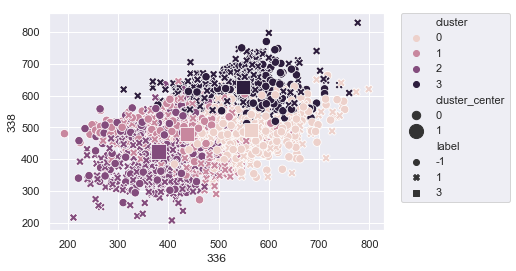

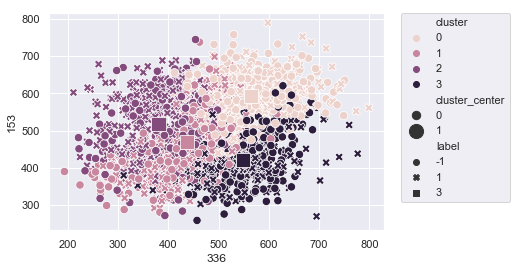

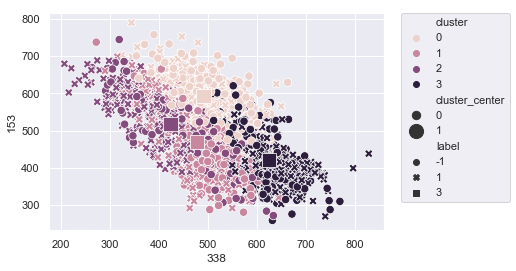

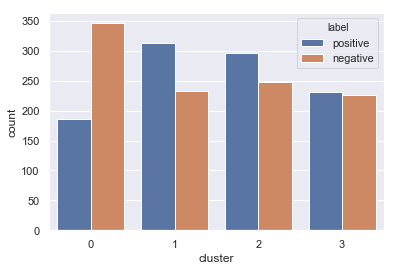

In [230]:
importlib.reload(helpers)
helpers.kmeans_experiment(X_train, y_train, 4)

### Experiment with 5 clusters

Features [453, 493, 105, 453, 493, 153, 105, 336, 105, 442, 493, 105, 453, 493, 105, 336, 64, 105, 336, 338, 455, 493, 153, 338]
Unique features [64, 105, 153, 336, 338, 442, 453, 455, 493]


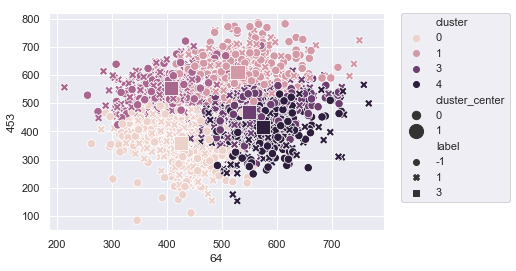

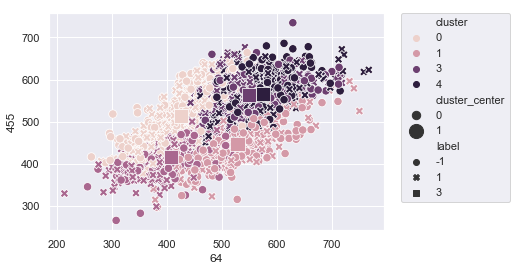

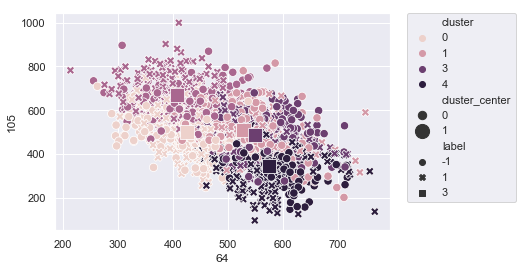

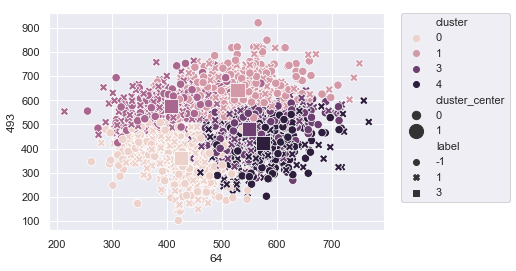

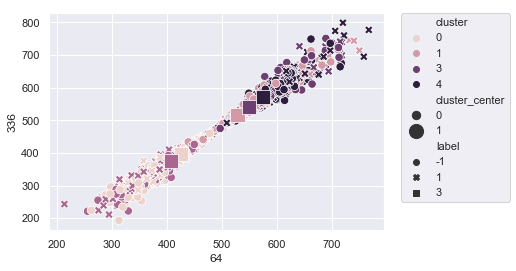

...

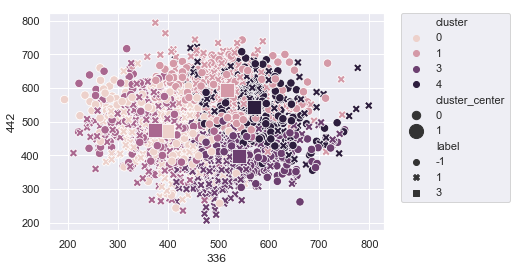

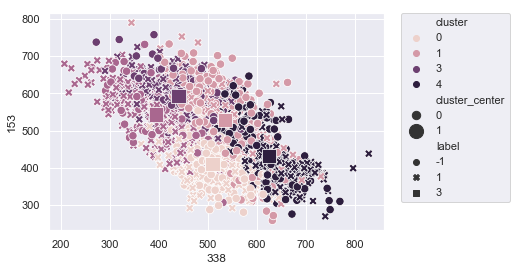

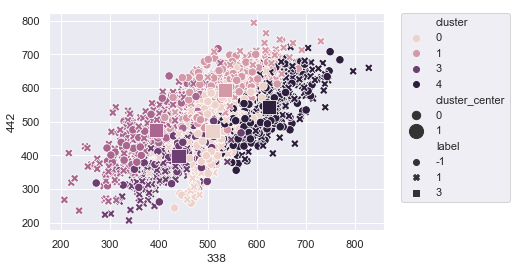

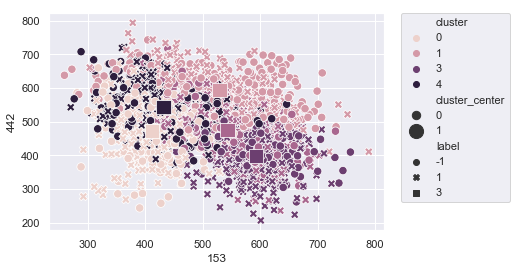

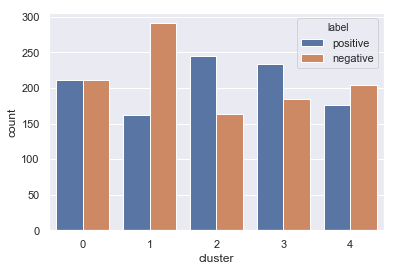

In [231]:
helpers.kmeans_experiment(X_train, y_train, 5)

### Experiment with 6 features

Features [105, 453, 493, 153, 442, 453, 493, 153, 336, 453, 493, 64, 105, 336, 105, 336, 105, 338, 442, 105, 336, 64, 105, 336, 338, 453, 455, 493, 153, 442, 442, 453, 493, 105, 153, 338, 153, 105, 493, 105, 153, 453, 493]
Unique features [64, 105, 153, 336, 338, 442, 453, 455, 493]


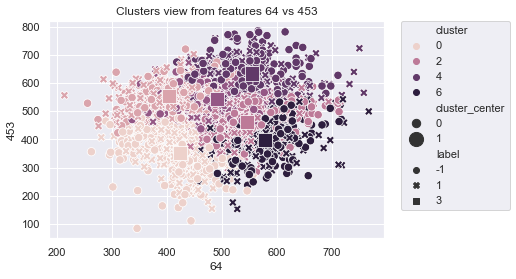

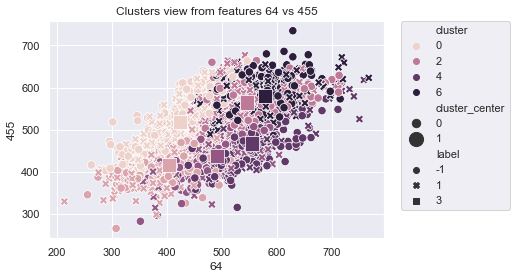

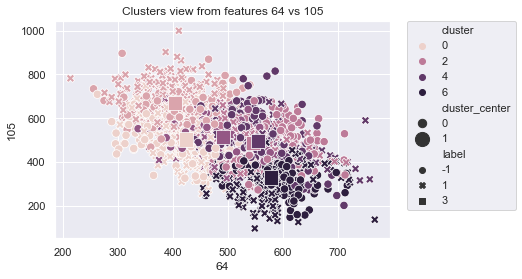

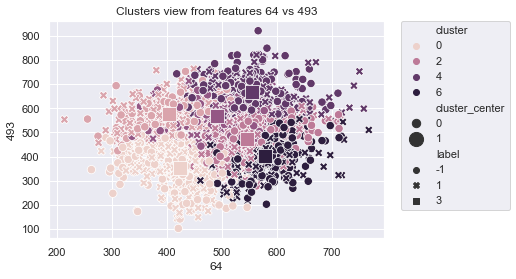

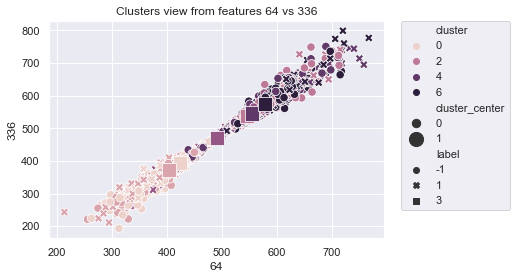

...

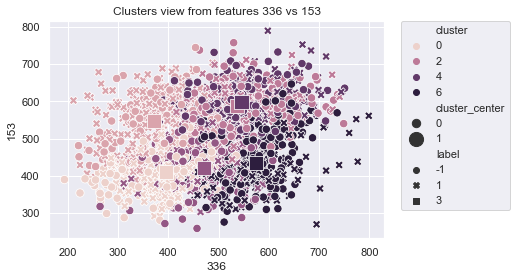

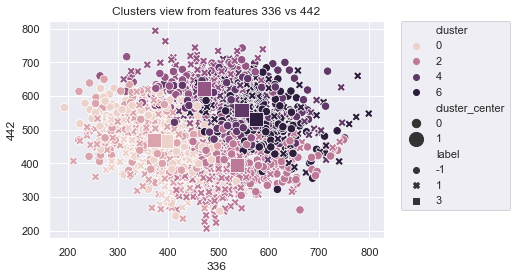

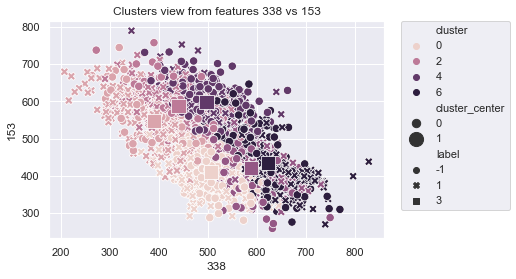

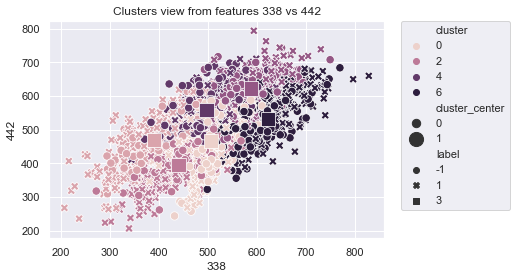

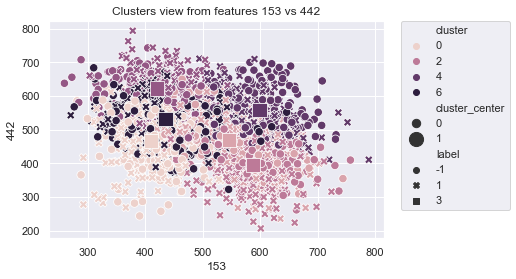

   cluster  negative  positive  pos_over_neg  total   pct_neg   pct_pos  \
0        0       191       191      1.000000    382  0.181387  0.185979   
1        1       140       247      1.764286    387  0.132953  0.240506   
2        2       180       222      1.233333    402  0.170940  0.216164   
3        3       151       116      0.768212    267  0.143400  0.112950   
4        4       198       110      0.555556    308  0.188034  0.107108   
5        5       193       141      0.730570    334  0.183286  0.137293   

   pct_total  
0   0.183654  
1   0.186058  
2   0.193269  
3   0.128365  
4   0.148077  
5   0.160577  


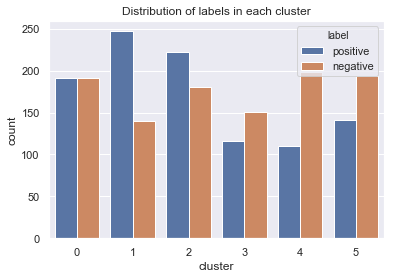

In [301]:
importlib.reload(helpers)
helpers.kmeans_experiment(X_train, y_train, 6)

## Telco

In [286]:
telX_train = pd.read_hdf('data/telco/telco.hdf', 'X_train')
tely_train = pd.read_hdf('data/telco/telco.hdf', 'y_train')
telX_scaled = pp.scale(telX_train)

In [242]:
start = time.time()
results = get_kmeans_scores(telX_train, ks=np.arange(1, 11))
stop = time.time()
print("Took", stop-start, "s")

Took 1.524980068206787 s


In [243]:
resultsDf = pd.DataFrame(data=results)
resultsDf

,k,score
0,1,2.885280e+10
1,2,6.318754e+09
2,3,2.932632e+09
3,4,1.685522e+09
4,5,1.063010e+09
5,6,7.254971e+08
6,7,5.325070e+08
7,8,4.155969e+08
8,9,3.308988e+08
9,10,2.648675e+08


Knee 3


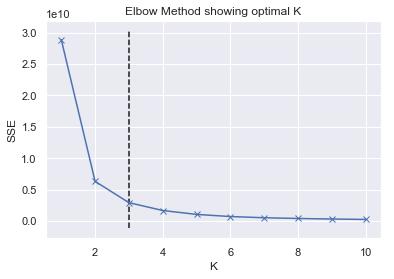

In [244]:
kn = KneeLocator(results['k'], results['score'], S=1.0, curve='convex', direction='decreasing')
kn.knee
plot_elbow_curve(results['k'], results['score'], xlabel='K')

Took 1.6038930416107178 s
Knee 4


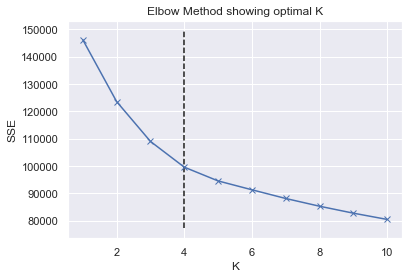

In [287]:
start = time.time()
results = get_kmeans_scores(telX_scaled, ks=np.arange(1, 11))
stop = time.time()
print("Took", stop-start, "s")
kn = KneeLocator(results['k'], results['score'], S=1.0, curve='convex', direction='decreasing')
kn.knee
plot_elbow_curve(results['k'], results['score'], xlabel='K')

Features [4, 14, 15, 4, 14, 15, 4, 14, 15, 4, 14, 15, 4, 14, 15, 4, 14, 15]
Unique features [4, 14, 15]


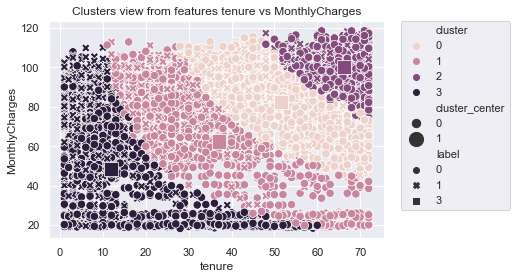

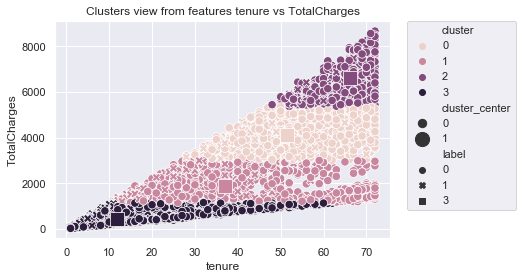

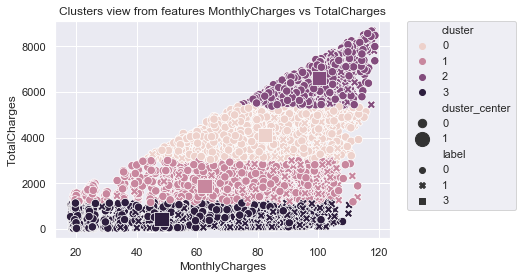

   cluster  negative  positive  pos_over_neg  total   pct_neg   pct_pos  \
0        0       789       173      0.219265    962  0.191041  0.115719   
1        1      1048       309      0.294847   1357  0.253753  0.206689   
2        2       696       100      0.143678    796  0.168523  0.066890   
3        3      1597       913      0.571697   2510  0.386683  0.610702   

   pct_total  
0   0.171022  
1   0.241244  
2   0.141511  
3   0.446222  


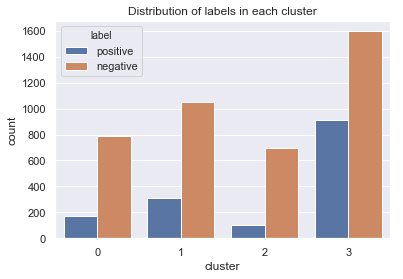

In [288]:
importlib.reload(helpers)
helpers.kmeans_experiment(pd.DataFrame(telX_train.values), pd.DataFrame(tely_train.values), 4, thresh=5, feature_names=telX_train.columns,
                         neg_val=0, random_state=1)

Features [14, 17, 18, 16, 18, 9, 11, 12, 14, 15, 18, 16, 17, 4, 15, 19, 4, 15]
Unique features [4, 9, 11, 12, 14, 15, 16, 17, 18, 19]


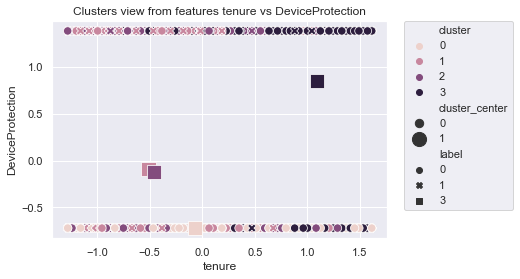

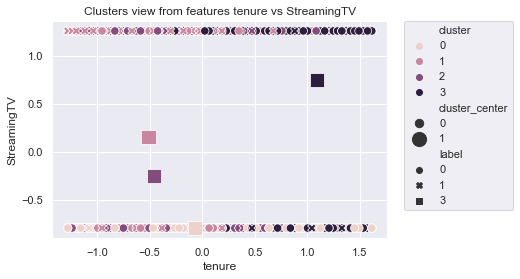

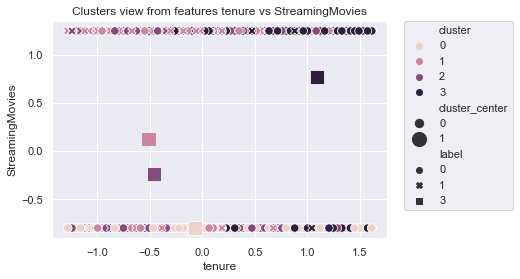

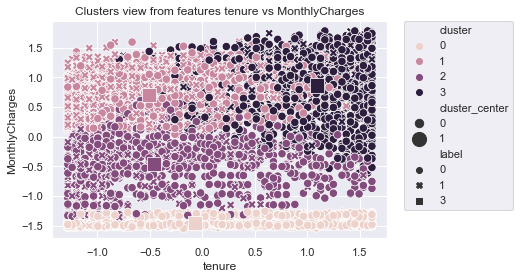

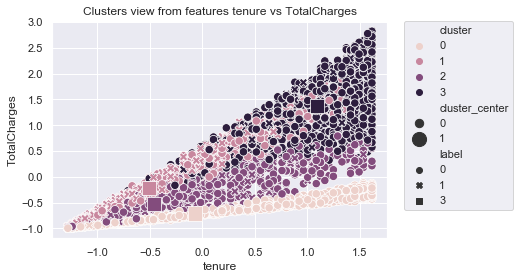

...

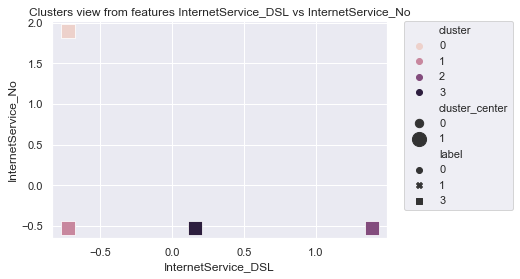

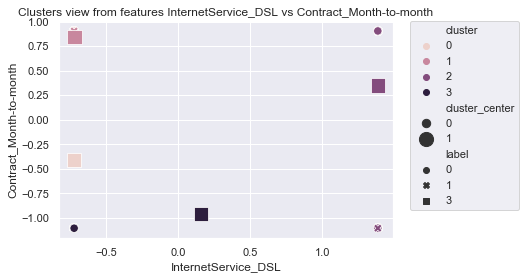

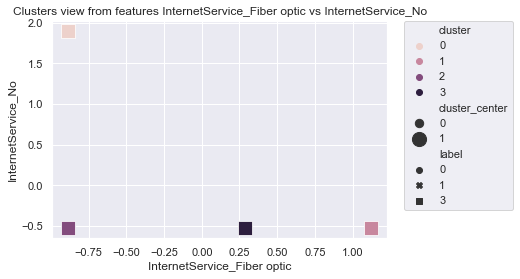

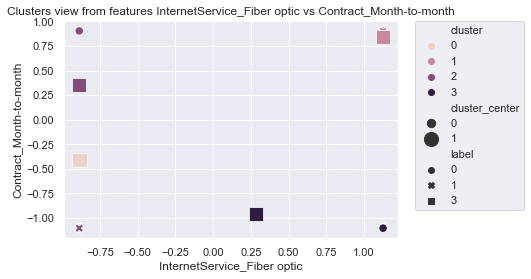

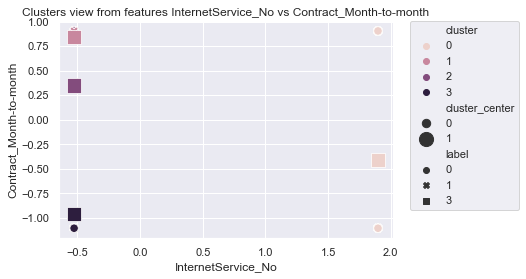

   cluster  negative  positive  pos_over_neg  total   pct_neg   pct_pos  \
0        0      1136        86      0.075704   1222  0.275061  0.057525   
1        1       730       929      1.272603   1659  0.176755  0.621405   
2        2       994       341      0.343058   1335  0.240678  0.228094   
3        3      1270       139      0.109449   1409  0.307506  0.092977   

   pct_total  
0   0.217244  
1   0.294933  
2   0.237333  
3   0.250489  


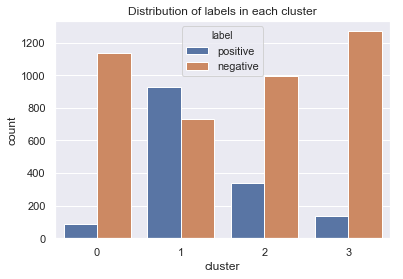

In [289]:
helpers.kmeans_experiment(pd.DataFrame(telX_scaled), pd.DataFrame(tely_train.values), 4, thresh=1.5, feature_names=telX_train.columns,
                         neg_val=0, random_state=1)

Features [4, 15, 19, 14, 15, 18, 14, 18]
Unique features [4, 14, 15, 18, 19]


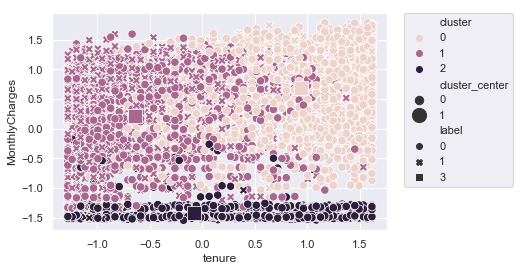

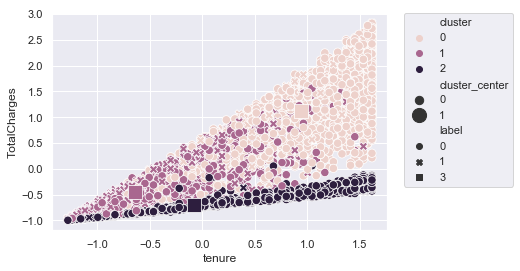

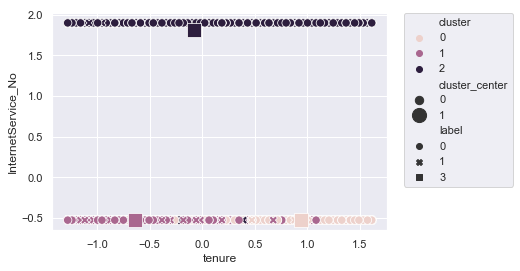

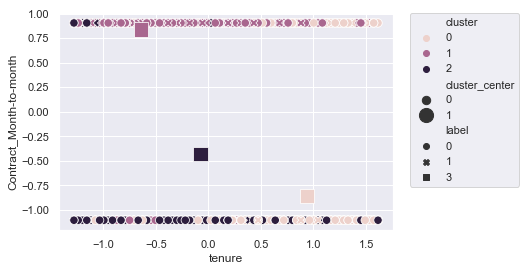

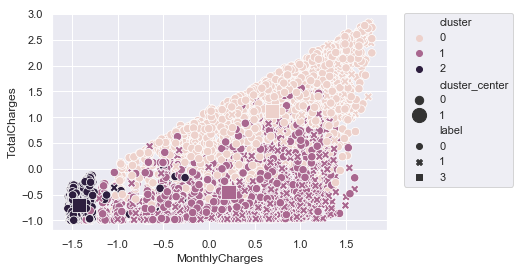

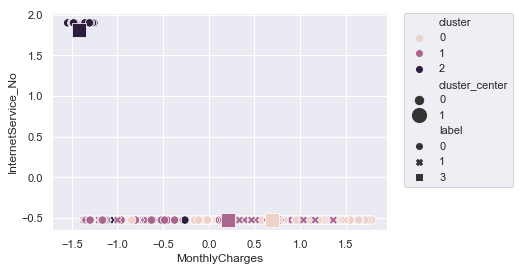

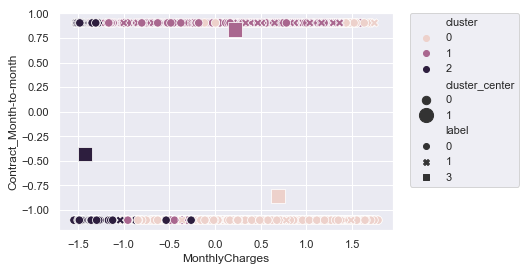

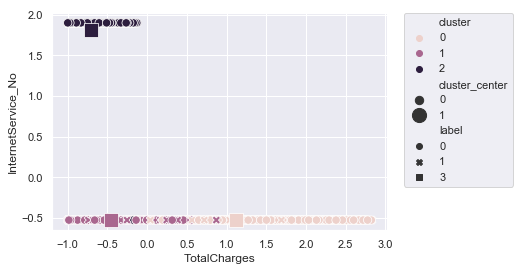

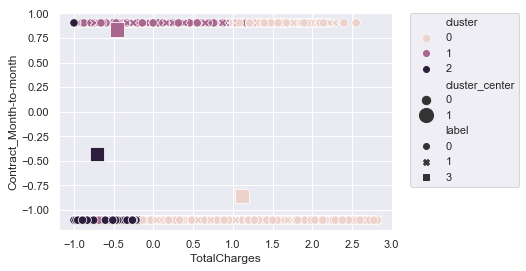

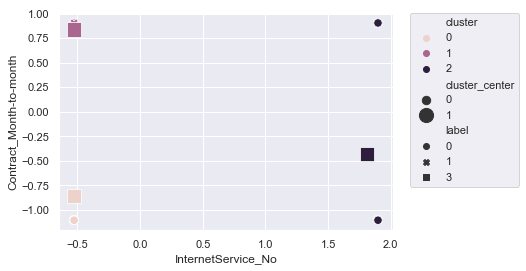

   cluster  negative  positive  total  pct_neg   pct_pos  pct_total
0        0      1624       202   1826  0.39322  0.135117   0.324622
1        1      1328      1205   2533  0.32155  0.806020   0.450311
2        2      1178        88   1266  0.28523  0.058863   0.225067


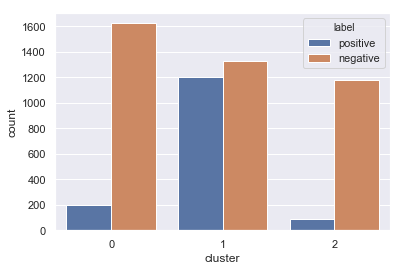

In [271]:
helpers.kmeans_experiment(pd.DataFrame(telX_scaled), pd.DataFrame(tely_train.values), 3, thresh=1.5, feature_names=telX_train.columns,
                         neg_val=0, random_state=1)

In [ ]:
ct.KMeans()